In [1]:
import os
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision.utils as vutils
from torch.utils.data import Subset

from WGANGP import Critic, Generator

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device")

Using cuda:0 device


In [3]:
batch_size = 64
epochs = 20
z_dim = 100
image_size = 64
c_lr = 2e-4
g_lr = 2e-4
n_critic = 5
gradient_weight = 10
initial_linear_layer_size = [-1, 128, 4, 4]
data_path = '../data/celeba'
image_save_path = './images/wgan_gp_celeba'

os.makedirs(image_save_path, exist_ok=True)

In [4]:
dataset = datasets.ImageFolder(root=data_path,
                               transform=transforms.Compose([
                                   transforms.Resize((image_size, image_size)),
                                   transforms.ToTensor(),
                                   transforms.Normalize((0.5, 0.5, 0.5),
                                                        (0.5, 0.5, 0.5))
                               ]))

dataloader = DataLoader(dataset=dataset,
                        batch_size=batch_size,
                        shuffle=True,
                        num_workers=4,
                        pin_memory=True,
                        drop_last=True)


2


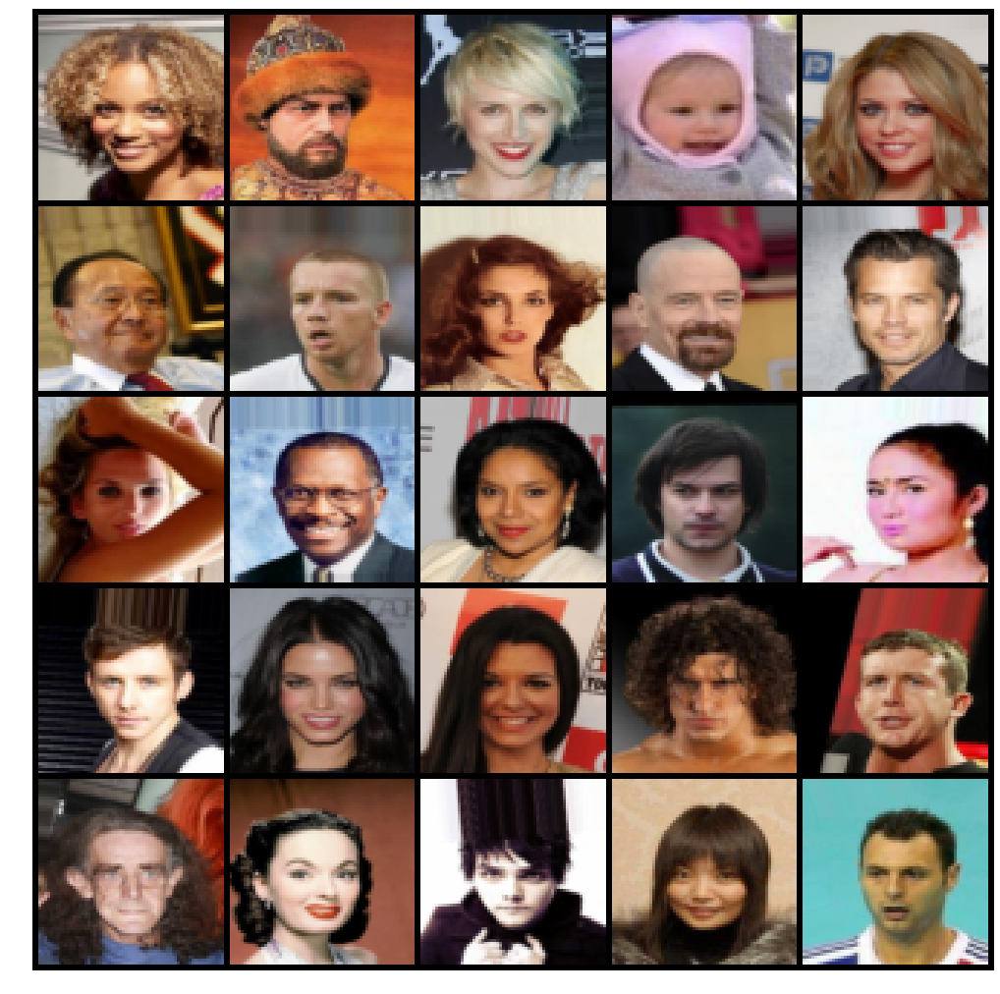

In [10]:
sample_image_batch_size = 25

def imshow(image):
    plt.figure(figsize=(18, 18))
    plt.axis("off")
    plt.imshow(np.transpose(vutils.make_grid((image + 1) * 0.5,
                                             nrow=5,
                                             padding=2,
                                             normalize=True), (1, 2, 0)))
    plt.savefig(os.path.join(image_save_path, 'sample_images.png'))
    
images = next(iter(dataloader))
imshow(images[0][:sample_image_batch_size])

In [6]:
generator = Generator(z_dim).to(device)
critic = Critic().to(device)
generator.train()
critic.train()

Critic(
  (layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear): Linear(in_features=8192, out_features=1, bias=True)
)

In [7]:
print(generator)

Generator(
  (linear): Linear(in_features=100, out_features=8192, bias=True)
  (batch_norm): BatchNorm1d(8192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (leaky_relu): LeakyReLU(negative_slope=0.2, inplace=True)
  (layers): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.8, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.8, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.8, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): ConvTranspo

In [8]:
print(critic)

Critic(
  (layers): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (3): LeakyReLU(negative_slope=0.2, inplace=True)
    (4): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(256, 512, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), bias=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear): Linear(in_features=8192, out_features=1, bias=True)
)


In [9]:
real_label = 1.
fake_label = -1.

d_optimizer = optim.Adam(params=critic.parameters(), lr=c_lr, betas=[0.5, 0.999])
g_optimizer = optim.Adam(params=generator.parameters(), lr=g_lr, betas=[0.5, 0.999])

In [10]:
# https://github.com/Lornatang/WassersteinGAN_GP-PyTorch/blob/master/wgangp_pytorch/utils.py

def gradient_penalty_loss(discriminator, real_images, fake_images):
    alpha = torch.randn((real_images.size(0), 1, 1, 1), device=device)
    interpolates = (alpha * real_images + ((1 - alpha) * fake_images)).requires_grad_(True)
    
    model_interpolates = discriminator(interpolates)
    grad_outputs = torch.ones(model_interpolates.size(), device=device, requires_grad=False)
    
    gradients = torch.autograd.grad(
        outputs=model_interpolates,
        inputs=interpolates,
        grad_outputs=grad_outputs,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = torch.mean((gradients.norm(2, dim=1) - 1) ** 2)
    return gradient_penalty

0 [D loss: (5.1815)(R -0.8398, F -1.2797, G 0.7301)] [G loss: 6.9998]
0 [D loss: (-33.5522)(R -21.8624, F -17.5020, G 0.5812)] [G loss: 39.9586]
0 [D loss: (-94.2320)(R -117.4015, F -19.1349, G 4.2304)] [G loss: 42.7691]
0 [D loss: (-124.5163)(R -154.2917, F -39.0197, G 6.8795)] [G loss: 74.1530]
0 [D loss: (-152.6733)(R -156.4426, F -76.1331, G 7.9902)] [G loss: 63.1613]
0 [D loss: (-161.3275)(R -200.0139, F -73.6063, G 11.2293)] [G loss: 112.9902]
0 [D loss: (-174.2852)(R -194.4630, F -82.9631, G 10.3141)] [G loss: 85.0126]
0 [D loss: (-182.3138)(R -207.1203, F -85.3702, G 11.0177)] [G loss: 81.0138]
0 [D loss: (-169.1061)(R -197.7250, F -92.1194, G 12.0738)] [G loss: 127.8452]
0 [D loss: (-167.1576)(R -186.0476, F -83.9192, G 10.2809)] [G loss: 76.6314]
0 [D loss: (-165.7266)(R -202.3839, F -71.2355, G 10.7893)] [G loss: 92.0940]
0 [D loss: (-164.4401)(R -202.1828, F -70.4274, G 10.8170)] [G loss: 103.4394]
0 [D loss: (-159.7874)(R -196.3461, F -59.7245, G 9.6283)] [G loss: 70.0416]

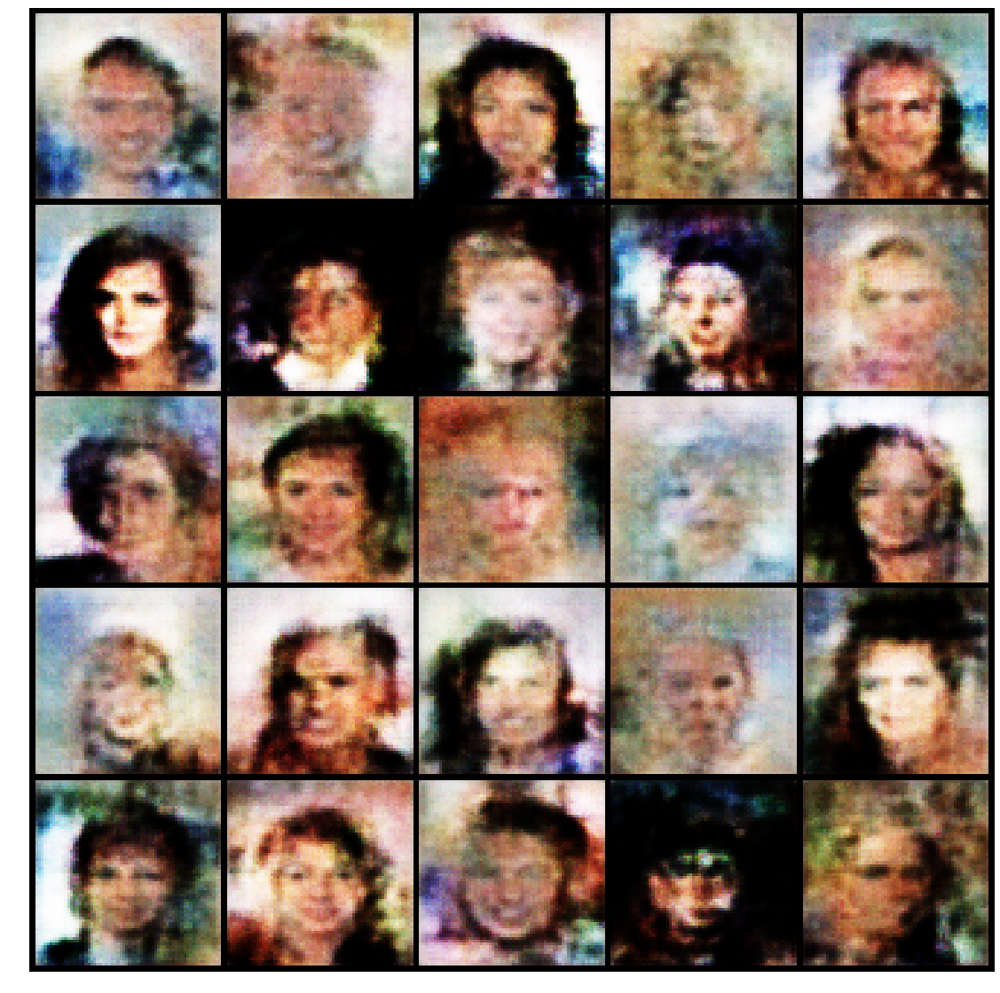

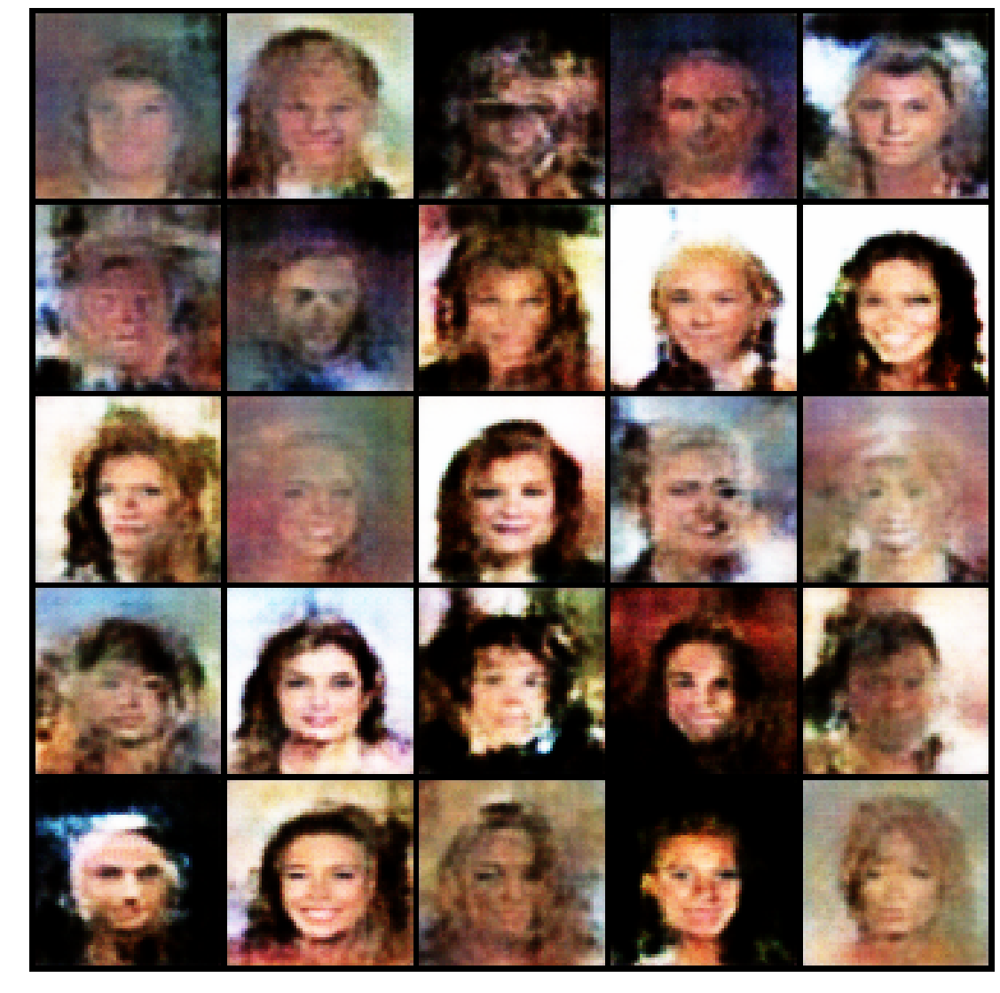

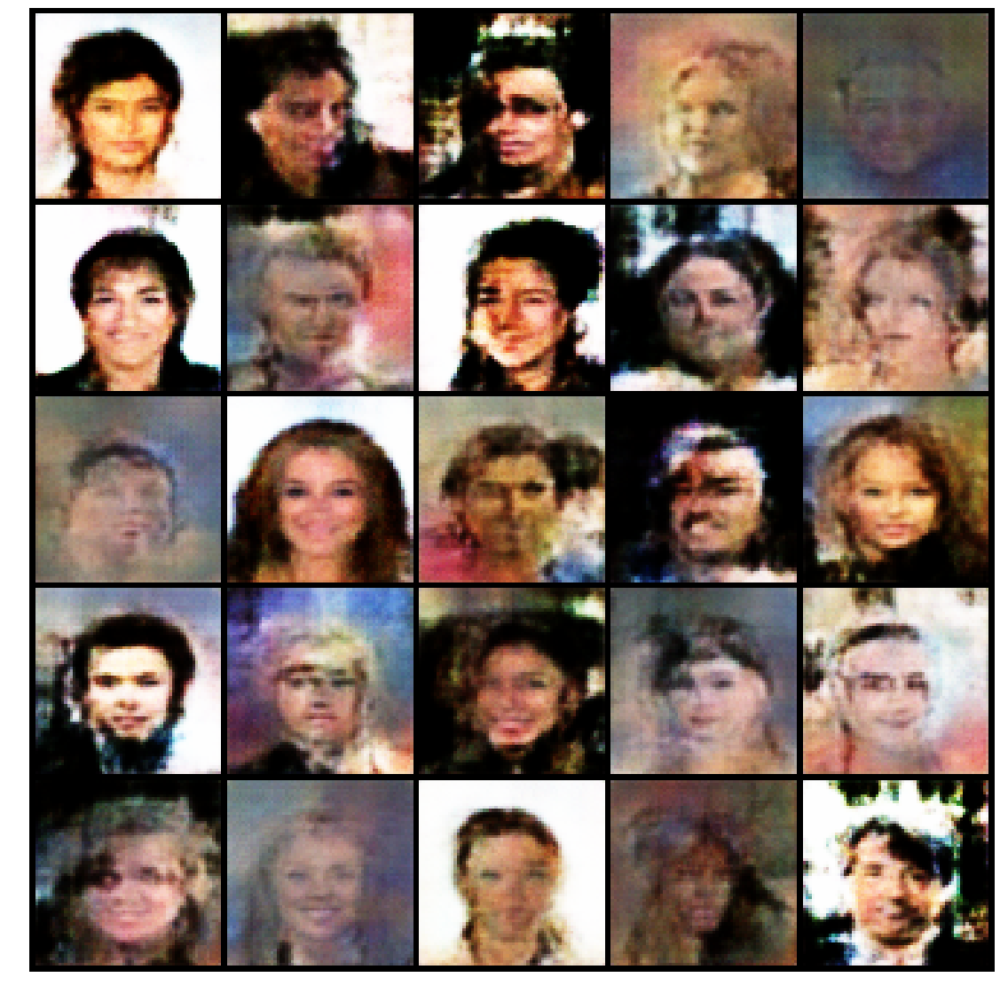

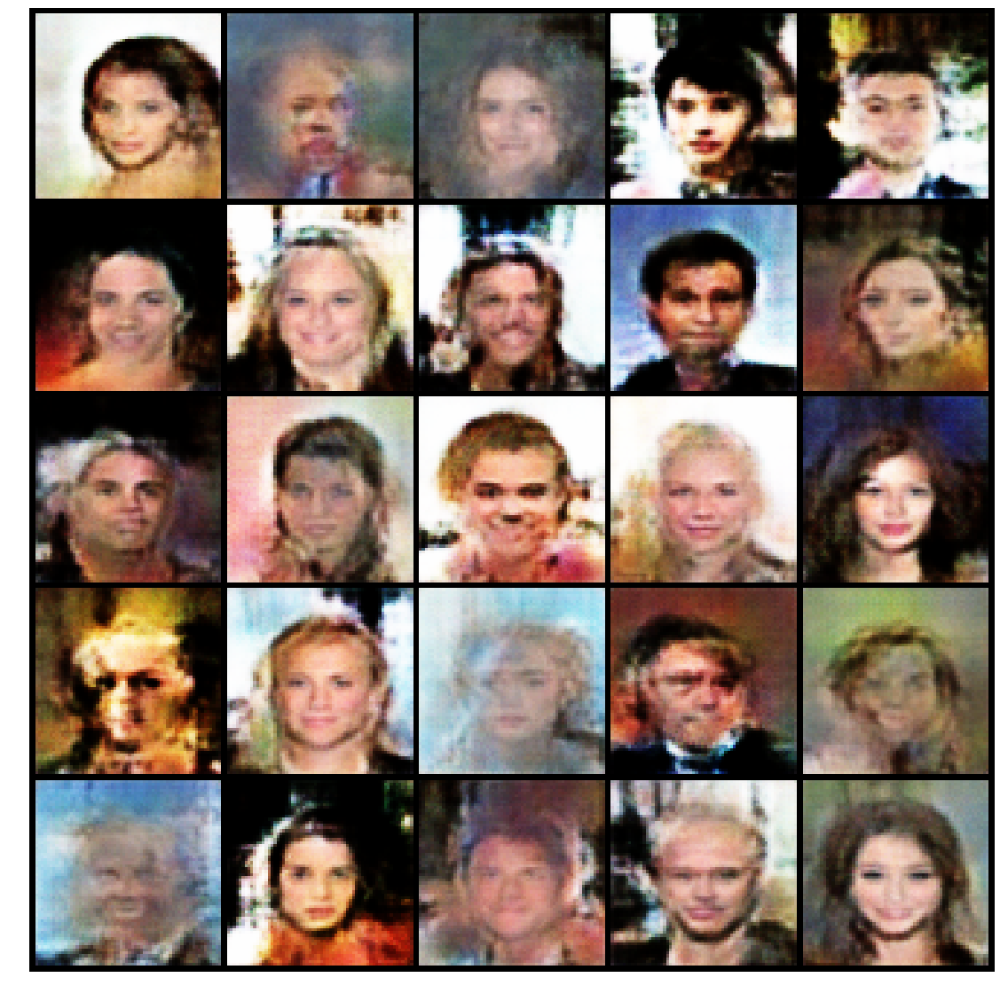

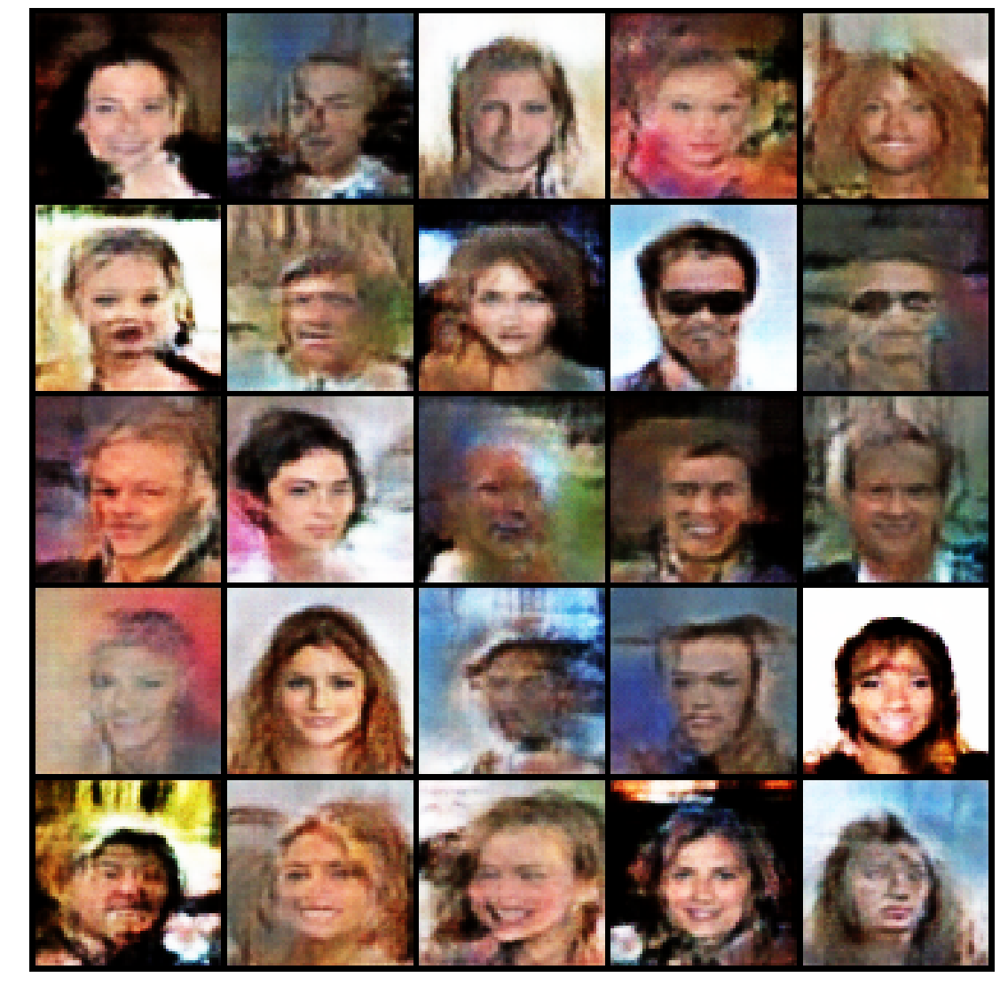

...

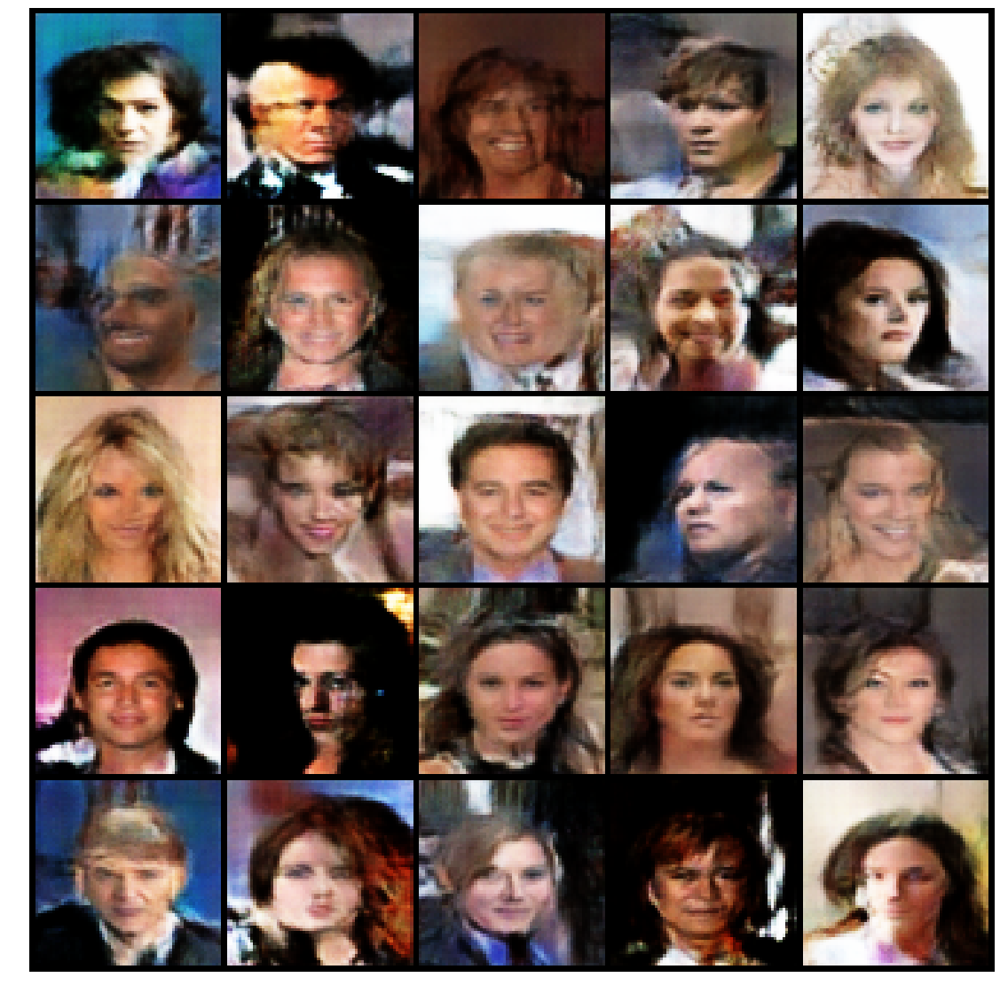

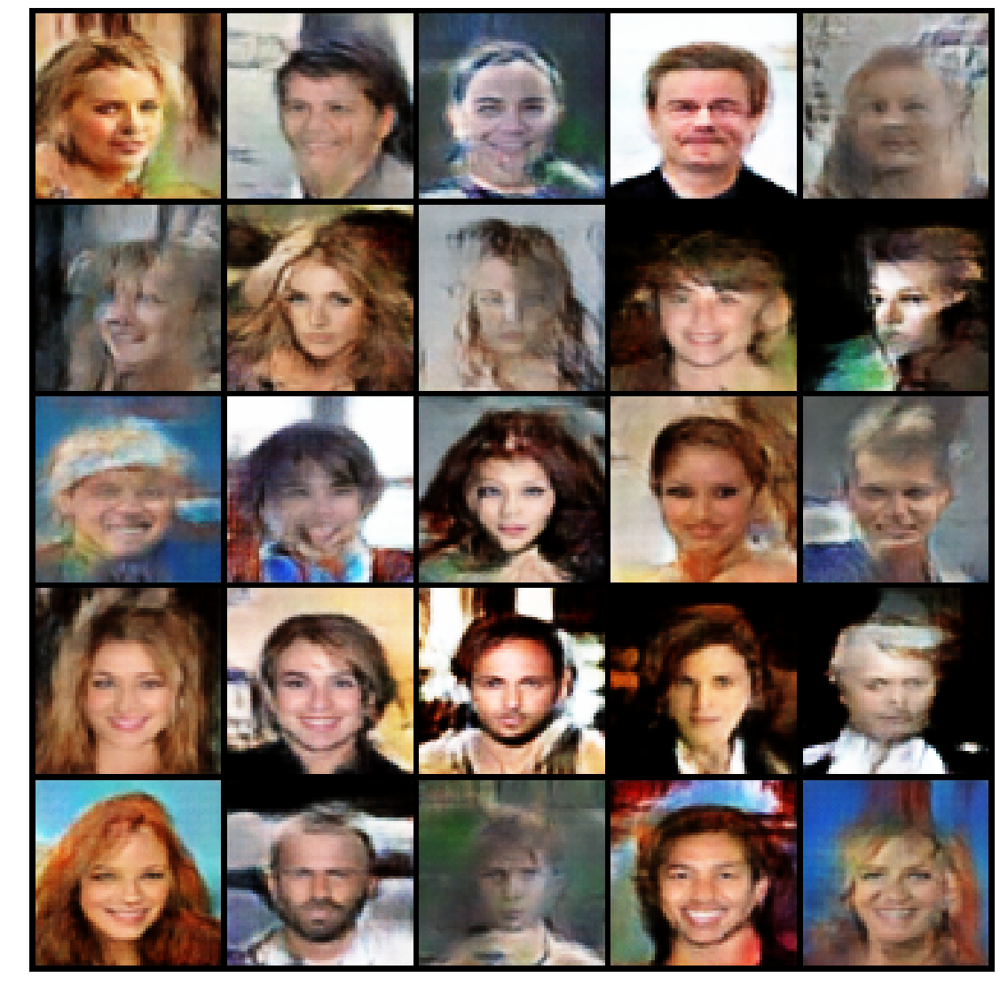

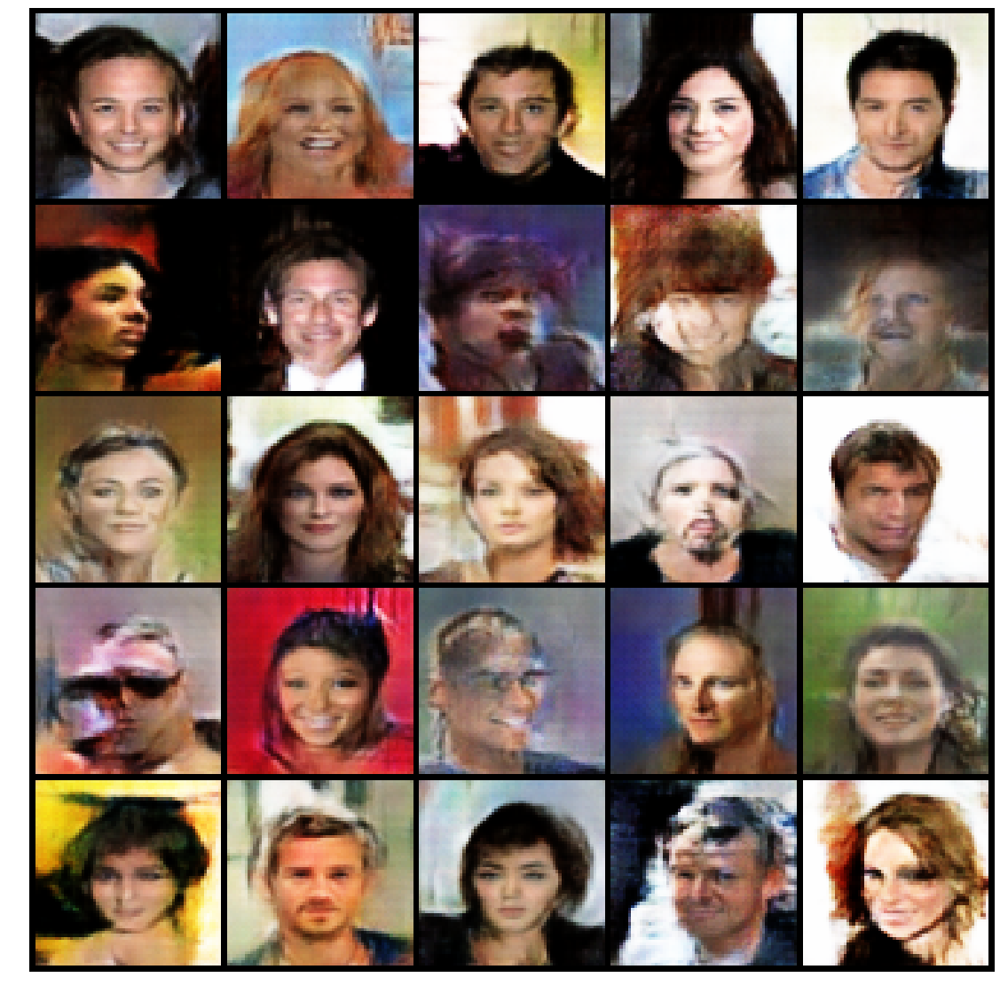

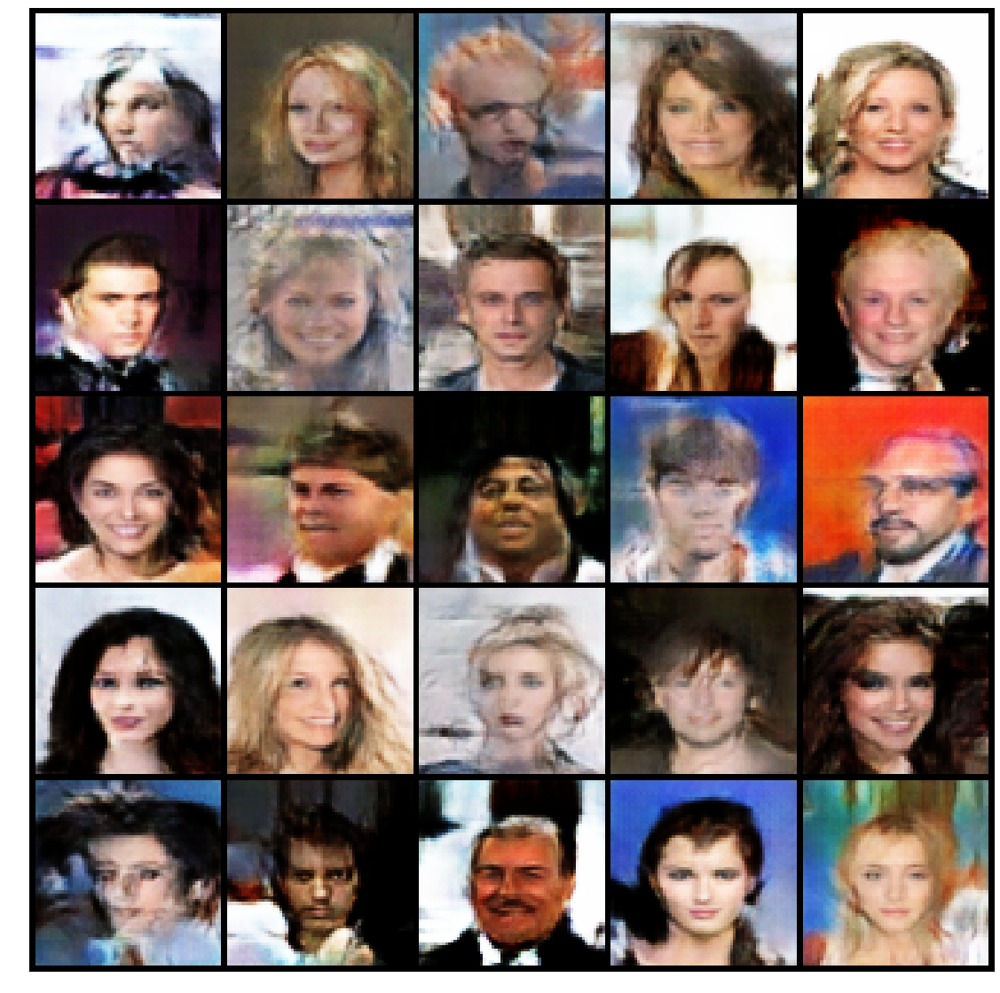

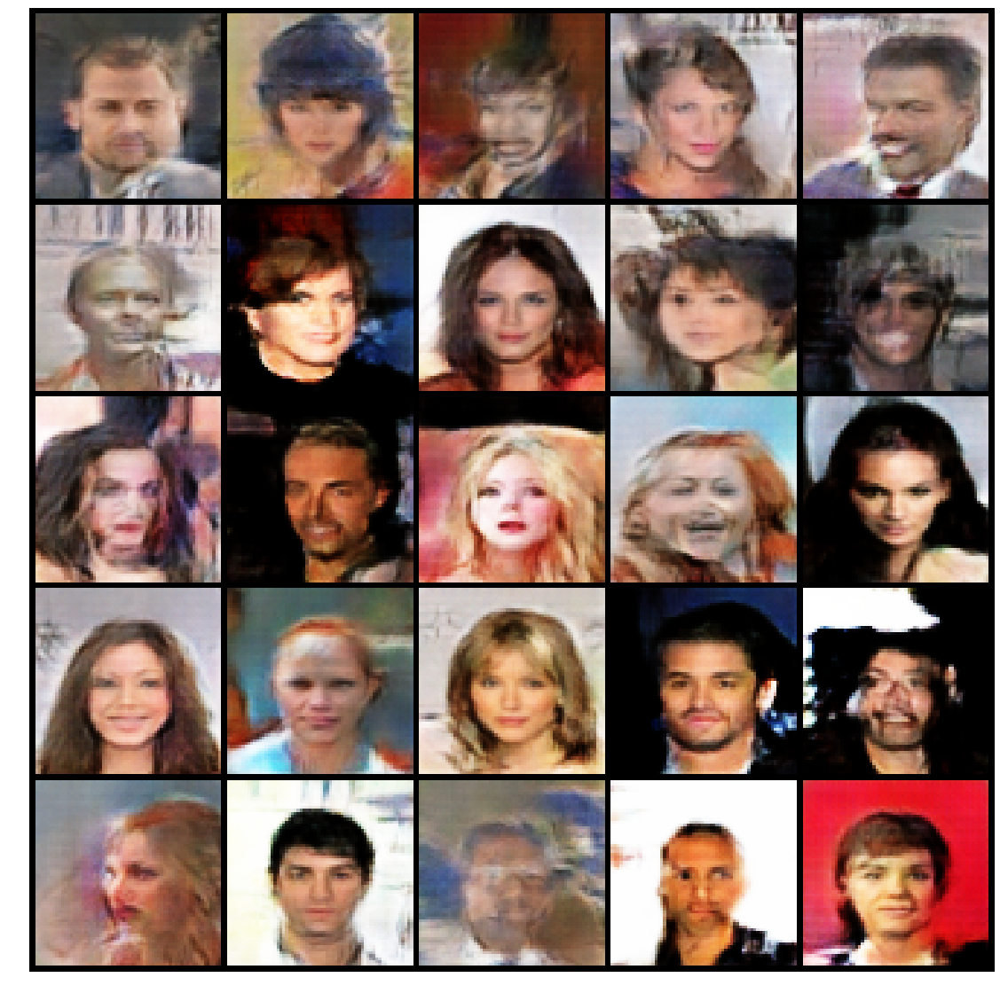

In [11]:
g_losses = []
d_losses = []
d_losses_real = []
d_losses_fake = []
grad_penalty_losses = []

n_batch_to_calc_loss = n_critic

n_batch_d_loss = 0.0
n_batch_d_loss_real = 0.0
n_batch_d_loss_fake = 0.0
n_batch_grad_penalty_loss = 0.0
n_batch_g_loss = 0.0

one = torch.FloatTensor([1]).to(device)
mone = one * -1

for epoch in range(epochs):
    for i, (inputs, _) in enumerate(dataloader):
        critic.zero_grad()
        
        # 진짜 데이터로 학습
        inputs = inputs.to(device)
        
        output = critic(inputs)
        d_loss_real = -output.mean().view(-1)
        
        # 가짜 데이터로 학습
        noise = torch.randn(batch_size, z_dim, device=device)
        fake = generator(noise)
        output = critic(fake)
        d_loss_fake = output.mean().view(-1)
        
        # Gradient Penalty
        gradient_penalty = gradient_penalty_loss(critic, inputs, fake)
        
        d_loss = d_loss_real + d_loss_fake + gradient_weight * gradient_penalty
        d_loss.backward()
        d_optimizer.step()
        
        n_batch_d_loss += d_loss
        n_batch_d_loss_real += d_loss_real
        n_batch_d_loss_fake += d_loss_fake
        n_batch_grad_penalty_loss += gradient_penalty
            
        if (i + 1) % n_critic == 0:
            for p in critic.parameters():
                p.requires_grad = False
            
            # Generator
            generator.zero_grad()
            noise = torch.randn(batch_size, z_dim, device=device)
            g_output = generator(noise)
            output = critic(g_output)
            g_loss = -output.mean().view(-1)
            g_loss.backward()
            g_optimizer.step()
                
            n_batch_g_loss += g_loss
            
            for p in critic.parameters():
                p.requires_grad = True
                
            n_batch_d_loss /= n_batch_to_calc_loss
            n_batch_d_loss_real /= n_batch_to_calc_loss
            n_batch_d_loss_fake /= n_batch_to_calc_loss
            n_batch_grad_penalty_loss /= n_batch_to_calc_loss
            #n_batch_g_loss /= n_batch_to_calc_loss / n_critic
            
            d_losses.append(n_batch_d_loss)
            d_losses_real.append(n_batch_d_loss_real)
            d_losses_fake.append(n_batch_d_loss_fake)
            grad_penalty_losses.append(n_batch_grad_penalty_loss)
            g_losses.append(n_batch_g_loss)
            
            print('%d [D loss: (%.4f)(R %.4f, F %.4f, G %.4f)] [G loss: %.4f]' %
                  (epoch, n_batch_d_loss, n_batch_d_loss_real, n_batch_d_loss_fake, n_batch_grad_penalty_loss, n_batch_g_loss))
            
            n_batch_d_loss = 0.0
            n_batch_d_loss_real = 0.0
            n_batch_d_loss_fake = 0.0
            n_batch_grad_penalty_loss = 0.0
            n_batch_g_loss = 0.0
    
    plt.figure(figsize=(20, 20))
    plt.axis("off")
    plt.imshow(np.transpose(vutils.make_grid(fake[:25] / 2 + 0.5,
                                            nrow=5,
                                            padding=2,
                                            normalize=False).detach().cpu(), (1, 2, 0)))
    plt.savefig(os.path.join(image_save_path, f'epoch_{epoch + 1}.png'))


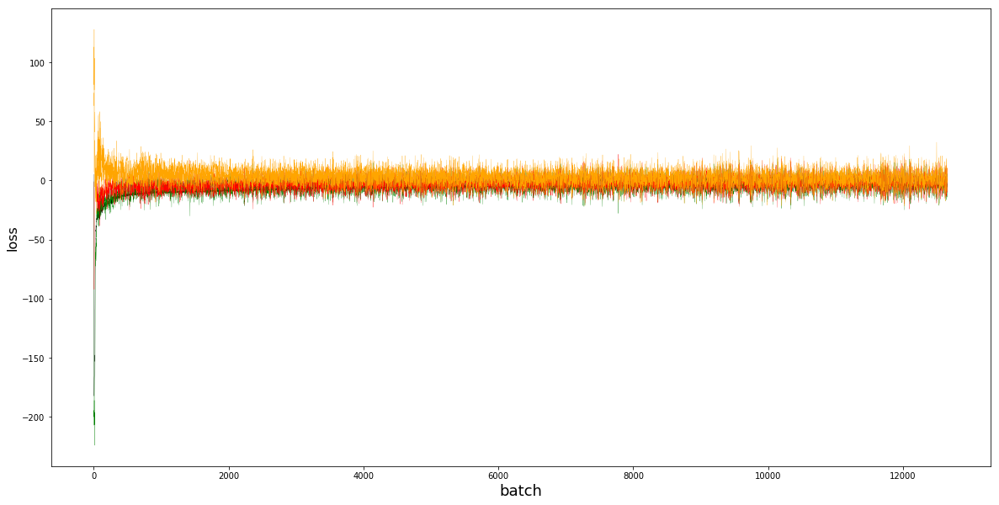

In [12]:
fig = plt.figure(figsize=(20, 10))

plt.plot([x for x in d_losses], color='black', linewidth=0.25)
plt.plot([x for x in d_losses_real], color='green', linewidth=0.25)
plt.plot([x for x in d_losses_fake], color='red', linewidth=0.25)
plt.plot([x for x in g_losses], color='orange', linewidth=0.25)

plt.xlabel('batch', fontsize=18)
plt.ylabel('loss', fontsize=16)

plt.savefig(os.path.join(image_save_path, f'loss_graph.png'))

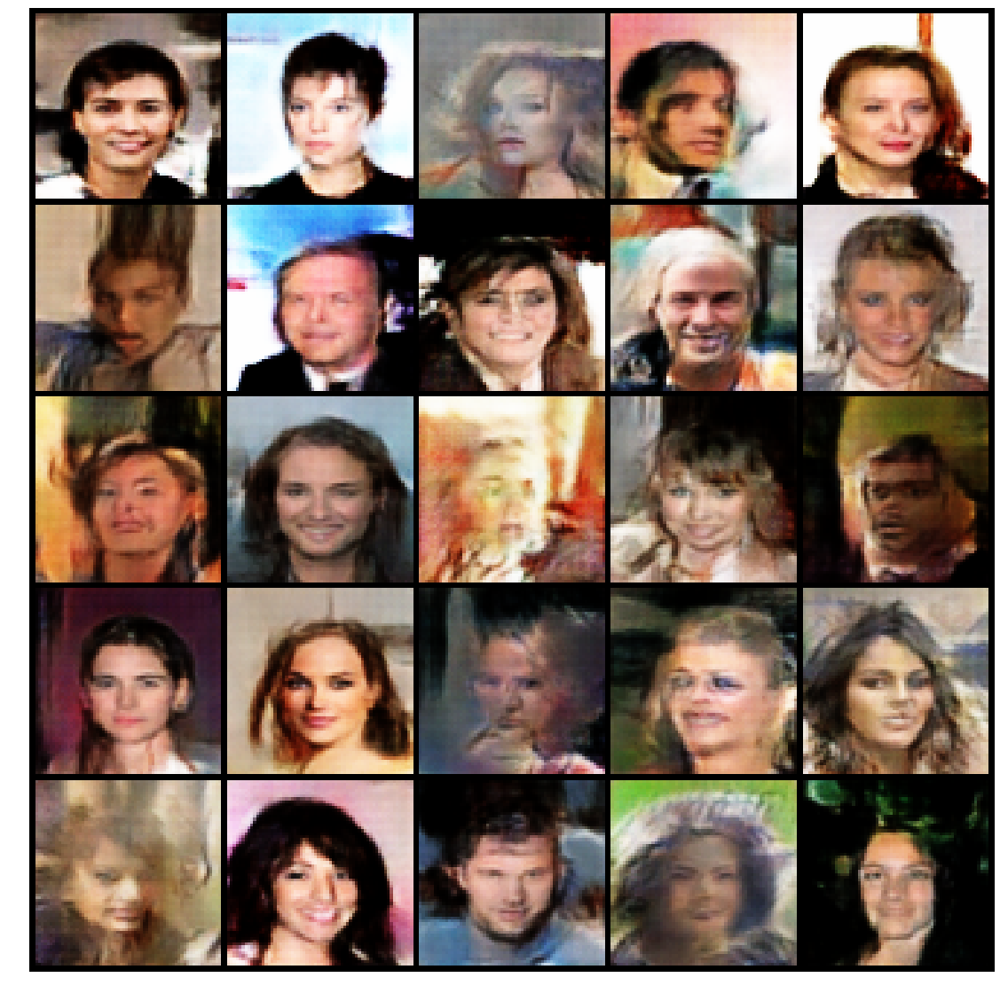

In [13]:
noise = torch.randn(25, z_dim, device=device)

gen_imgs = generator(noise).detach().cpu()

plt.figure(figsize=(20, 20))
plt.axis("off")
plt.imshow(np.transpose(vutils.make_grid(gen_imgs / 2 + 0.5,
                                         nrow=5,
                                         padding=2,
                                         normalize=False), (1, 2, 0)))
plt.savefig(os.path.join(image_save_path, f'gen_imgs.png'))